In [ ]:
!pip install agentpy

# Ambiente  

*   `GridEnvironment` define una rejilla con diversas celdas objetivos que tiene una recompensa de 100, y celdas obstáculo, con recompensa -100. Las demás celdas tienen una recompensa de -1.
*   `move_agent` mueve al agente en la rejilla según la acción elegida.
*   `reset` para el proceso de entrenamieno, vuelve a generar el ambiente inicial para un nuevo ciclo de aprendizaje.

In [ ]:
import agentpy as ap, numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib.colors as mcolors
import seaborn as sns
import IPython

class GridEnvironment(ap.Grid):
    def setup(self):
        self.room_size = self.p.grid_size
        self.goal = self.p.goal
        self.room = np.zeros((self.room_size, self.room_size))

    def get_reward(self, state):
            reward = 10 if state == self.goal else 0
            return reward - 1


#Agente: Un agente que aplica QLearning como proceso de aprendizaje

In [ ]:
class QLearningAgent(ap.Agent):
    def setup(self):
        # Actions are linked to a movement in the grid.
        self.actions = {'up': (-1,0), 'down': (1, 0), 'left': (0, -1), 'right': (0, 1)}
        self.env = self.model.env
        self.reward = 0
        # Else assign values
        self.Q = self.p.Q
        # Learning policies
        self.epsilon = self.p.epsilon
        self.alpha = self.p.alpha
        self.gamma = self.p.gamma

        # The following variables have been added for informative purpose
        self.is_epsilon = False
        self.next_action = None

    '''
    Actual action execution. This process will be employed after agent has trained
    '''
    def execute(self):
        action = self.next_action
        state = self.get_position()
        self.env.move_by(self, self.actions[action])
        new_state = self.get_position()
        reward = self.env.get_reward(new_state)
        self.update_Q(state, action, reward, new_state)    # Update Q-values
        self.reward += reward

    '''
    Get position of agent in environment
    '''
    def get_position(self):
        return self.env.positions[self]

    '''
    Applying epsilon greedy policy
    '''
    def choose_action(self):
        state = self.get_position()
        random = self.model.random
        self.is_epsilon = random.uniform(0, 1) < self.epsilon
        if self.is_epsilon:
            self.next_action = random.choice(list(self.actions.keys()))
        else:
            self.next_action = max(self.Q[state], key=self.Q[state].get)

    '''
    Updating Q-values according to definition
    '''
    def update_Q(self, state, action, reward, new_state):
        max_Q_new_state = max(self.Q[new_state].values())
        self.Q[state][action] = self.Q[state][action] + self.alpha * (
            reward + self.gamma * max_Q_new_state - self.Q[state][action])

    '''
    Training. Agent will be able to perform a number of training steps.
    A complete cycle finishes until agent reaches the goal
    '''
    def train(self, episodes):
        for i in range(episodes):
            while self.get_position() != self.env.goal:
                self.choose_action()
                self.execute()
            self.env.move_to(self, self.p.init)

#Modelo:


In [ ]:
class QLearningModel(ap.Model):
    def setup(self):
        self.env = GridEnvironment(self, shape=(self.p.grid_size, self.p.grid_size))
        self.agent = QLearningAgent(self)
        self.env.add_agents([self.agent], positions=[self.p.init])

        # Executing training steps for the agent. Modify parameters as needed after execution
        print('training....')
        self.agent.train(self.p.train_episodes)

        print('executing....')
        # Setting the agent in its initial position, and zero reward
        self.env.move_to(self.agent, self.p.init)
        self.agent.reward = 0

    def step(self):
        self.agent.execute()

    def update(self):
        if self.agent.get_position() == self.model.p.goal:
            #print('ending')
            self.env.move_to(self.agent, self.p.init)
            self.agent.reward = 0
        self.agent.choose_action()


    # Report Q-values
    def end(self):
        self.report('Q-Table', self.agent.Q)


# Visualizando entrenamiento

Se ejecuta una prueba del agente en modo "prueba" (test) para observar el proceso de entrenamiento. Esto es, con una matriz de valores Q inicializados en 0.

In [ ]:
N = 4
# inicialización de Q-values en 0
actions = ['up', 'down', 'left', 'right']
Q = {}
for x in range(N):
    for y in range(N):
        Q[(x, y)] = {action: 0 for action in actions}

parameters = {
    'grid_size': N,
    'init': (0,0),
    'goal': (N-1, N-1),
    'train_episodes': 0,
    'epsilon': 0.1,
    'alpha': 0.9,
    'gamma': 0.9,
    'steps': 200,
    'Q': Q,
}


def animation_plot(model, axes):
    ax1, ax2, ax3, ax4, ax5, ax6 = axes
    Qtables = [np.array([model.agent.Q[i,j][act] for i in range(N) for j in range(N)]).reshape((N, N)) for act in actions]
    U, D, L, R = Qtables
    pos = model.agent.get_position()

    # Draw agent movements
    grid1 = np.zeros(model.env.shape)
    grid1[pos] = model.agent.id
    ap.gridplot(grid1, cmap='Greys', ax=ax1)
    ax1.set_title("Agent Q-Learning\nReward:{}\nAction: {}{}".format(model.agent.reward,
        model.agent.next_action, '*' if model.agent.is_epsilon else ''))
    ax1.set_xticks([])
    ax1.set_yticks([])

    # Draw only maximum value on each position.
    grid2 = np.maximum(U, D)
    grid2 = np.maximum(grid2, L)
    grid2 = np.maximum(grid2, R)
    normalize = mcolors.TwoSlopeNorm(vcenter=0, vmin=min(np.min(grid2), -3), vmax=max(3, np.max(grid2)))
    sns.heatmap(grid2, norm=normalize, annot=True, cmap='RdBu', cbar=False, ax=ax2)
    ax2.set_title("Maximum Q-values")
    ax2.set_xticks([])
    ax2.set_yticks([])

    # Drawing individual Tables per action
    for i in range(4):
        normalize = mcolors.TwoSlopeNorm(vcenter=0, vmin=min(np.min(Qtables[i]), -3), vmax=max(3, np.max(Qtables[i])))
        sns.heatmap(Qtables[i], norm=normalize, annot=True, cmap='RdBu', cbar=False, ax=axs[2+i])
        axs[2+i].set_title(actions[i].upper())
        axs[2+i].set_xticks([])
        axs[2+i].set_yticks([])



#    ax4.set_title("Maximum Q-values".format(
#        model.agent.reward, pos, model.agent.Q[pos]))


#fig, axs = plt.subplot_mosaic("AB;CD")
fig = plt.figure(figsize=(15, 5))
gs = fig.add_gridspec(2,4,width_ratios=[2,2,1,1])
ax1 = fig.add_subplot(gs[:,0])
ax2 = fig.add_subplot(gs[:,1])
ax3 = fig.add_subplot(gs[0,2])
ax4 = fig.add_subplot(gs[1,2])
ax5 = fig.add_subplot(gs[0,3])
ax6 = fig.add_subplot(gs[1,3])
axs = [ax1, ax2, ax3, ax4, ax5, ax6]

model1 = QLearningModel(parameters)
animation = ap.animate(model1, fig, axs, animation_plot)
IPython.display.HTML(animation.to_jshtml())


training....
executing....


In [ ]:
# Visualizing training results by episode
class EpisodesModel(ap.Model):
    def setup(self):
        self.env = GridEnvironment(self, shape=(self.p.grid_size, self.p.grid_size))
        self.agent = QLearningAgent(self)
        self.env.add_agents([self.agent], positions=[self.p.init])

    def step(self):
        self.agent.train(1)

    # Report Q-values
    def end(self):
        self.report('Q-Table', self.agent.Q)

N = 5
# inicialización de Q-values en 0
actions = ['up', 'down', 'left', 'right']
Q = {}
for x in range(N):
    for y in range(N):
        Q[(x, y)] = {action: 0 for action in actions}

parameters = {
    'grid_size': N,
    'init': (0,0),
    'goal': (N-1, N-1),
    'train_episodes': 0,
    'epsilon': 0.1,
    'alpha': 0.1,
    'gamma': 0.9,
    'steps': 100,
    'Q': Q,
}

def animation_plot(model, ax):
    # Grafica el máximo valor de cada acción de acuerdo a la celda
    U, D, L, R = [np.array([model.agent.Q[i,j][act] for i in range(N) for j in range(N)]).reshape((N,N)) for act in actions]
    grid = np.maximum(U, D)
    grid = np.maximum(grid, L)
    grid = np.maximum(grid, R)

    normalize = mcolors.TwoSlopeNorm(vcenter=0, vmin=min(np.min(grid), -2), vmax=max(5, np.max(grid)))
    sns.heatmap(grid, norm=normalize, annot=True, cmap='RdBu', cbar=False, ax=ax)

    ax.set_title("Training Agent")
    ax.set_xticks([])
    ax.set_yticks([])

fig, ax = plt.subplots()
model = EpisodesModel(parameters)
animation = ap.animate(model, fig, ax, animation_plot)
IPython.display.HTML(animation.to_jshtml())

training....
executing....
training....
executing....
training....
executing....
training....
executing....
training....
executing....
training....
executing....
training....
executing....
training....
executing....
training....
executing....
training....
executing....
training....
executing....
training....
executing....
training....
executing....
training....
executing....
training....
executing....
training....
executing....


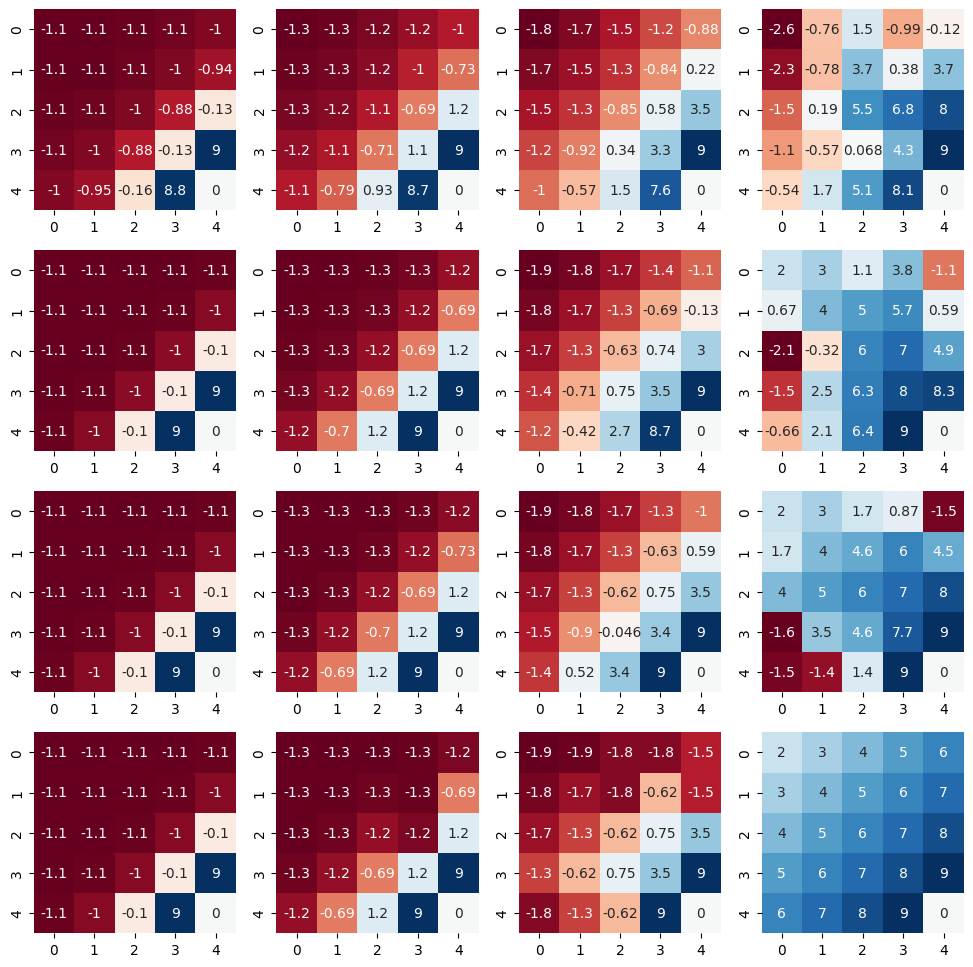

In [ ]:
import sys

fig, axs = plt.subplots(4, 4, figsize=(12, 12))
e = .1
i = 0
for a in (.1, .25, .5, 1):
    j = 0
    for g in (.1, .25, .5, 1):
            # Initialize Q-table
            Q = {}
            for x in range(N):
                for y in range(N):
                    Q[(x, y)] = {action: 0 for action in actions}

            # Parameters for current execution
            parameters = {
                'grid_size': N,
                'init': (0,0),
                'goal': (N-1, N-1),
                'train_episodes': 100,
                'epsilon': e,
                'alpha': a,
                'gamma': g,
                'steps': 0,
                'Q': Q,
            }

            # Plot resulting Q-table
            model = QLearningModel(parameters)
            model.run(display=False)
            sys.stdout.write('\r')
            U, D, L, R = [np.array([model.agent.Q[i,j][act] for i in range(N) for j in range(N)]).reshape((N,N)) for act in actions]
            grid = np.maximum(U, D)
            grid = np.maximum(grid, L)
            grid = np.maximum(grid, R)
            normalize = mcolors.TwoSlopeNorm(vcenter=0, vmin=min(np.min(grid), -.1), vmax=max(.1, np.max(grid)))
            sns.heatmap(grid, norm=normalize, annot=True, cmap='RdBu', cbar=False, vmin=-5, vmax=5, ax=axs[i][j])
            j+= 1
    i += 1



In [ ]:
'*' if True else ''

'*'